In [1]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO

# Load a base model
model = YOLO("yolov8n.pt")  # Start with COCO-pretrained

# Train on a food dataset (e.g., UEC-Food100)
model.train(
    data="food.yaml",  # Dataset config (define classes/paths)
    epochs=50,
    imgsz=640,
    batch=16
)

Ultralytics 8.3.98 🚀 Python-3.12.3 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=food.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, sh

RuntimeError: Dataset 'food.yaml' error ❌ 'food.yaml' does not exist


0: 640x640 1 fork, 2 knifes, 1 bowl, 2 pizzas, 1 dining table, 6.2ms
Speed: 14.3ms preprocess, 6.2ms inference, 256.8ms postprocess per image at shape (1, 3, 640, 640)


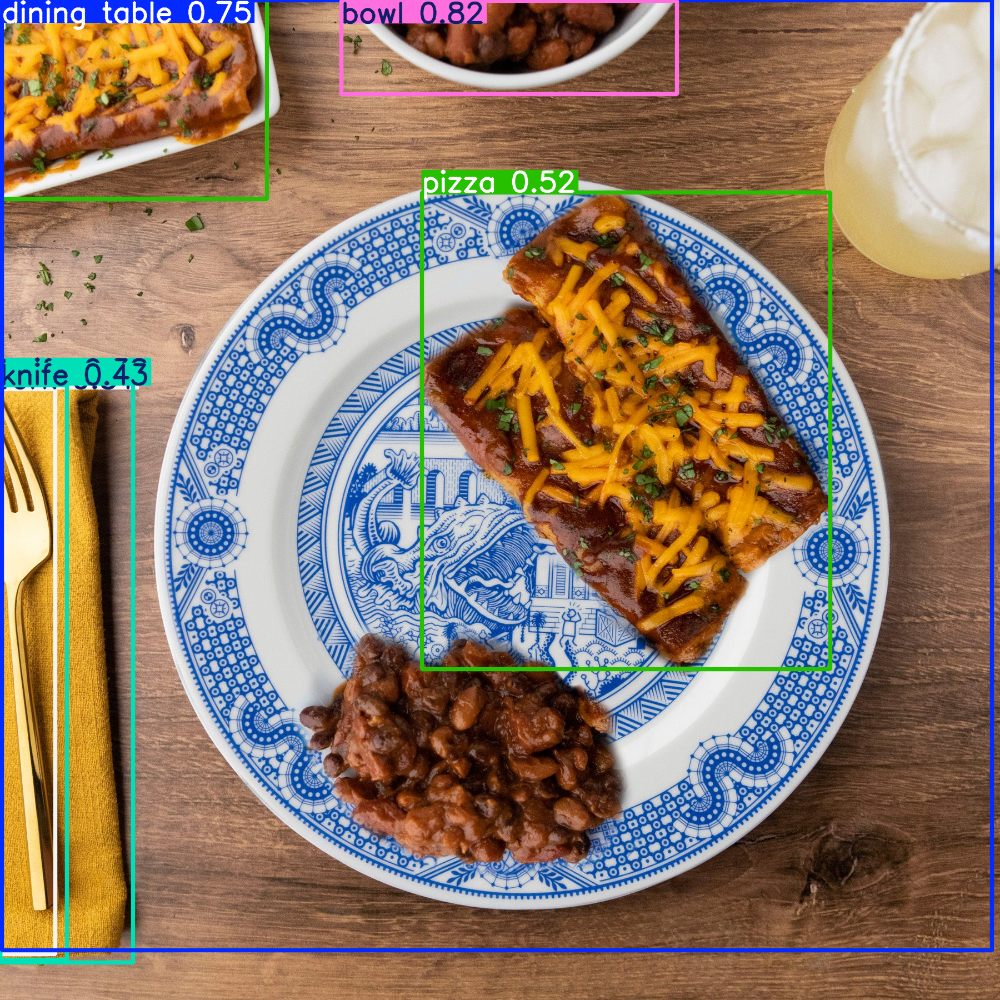

In [2]:
# Example: Detect foods in an image
image_url = "https://calamityware.com/cdn/shop/products/CalamitywarePlate6-SeaMonster_2_2048x.jpg?v=1657222063"  # Replace with your image URL
response = requests.get(image_url)
img = Image.open(BytesIO(response.content))

# Run YOLOv8 inference
results = model.predict(img)
results[0].show()  # Display bounding boxes

In [4]:
!pip install roboflow

from roboflow import Roboflow

# Paste your API key here (replace "YOUR_API_KEY")
rf = Roboflow(api_key="g5Spd8WUbhxrM2UD883G")

# Download the dataset
project = rf.workspace("gp-bvrcn").project("gp-n7jdm")
version = project.version(4)
dataset = version.download("yolov8")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 2.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 2.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 2.4 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to GP-4 in yolov8:: 100%|████████████████| 5812/5812 [00:00<00:00, 6160.29it/s]


In [5]:
# Load YOLO
model = YOLO("yolov8n.pt")  # Small model

# Train on the Roboflow dataset
model.train(data="/root/Projects/Hackathon/MacroVision/GP-4/data.yaml", epochs=50)

Ultralytics 8.3.98 🚀 Python-3.12.3 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/root/Projects/Hackathon/MacroVision/GP-4/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train6, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=F

100%|██████████████████████████████████████████████████████████████████████| 755k/755k [00:00<00:00, 9.37MB/s]

Overriding model.yaml nc=80 with nc=19

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

 19                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
 20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 21                  -1  1    493056  ultralytics.nn.modules.block.C2f             [384, 256, 1]                 
 22        [15, 18, 21]  1    755017  ultralytics.nn.modules.head.Detect           [19, [64, 128, 256]]          
Model summary: 129 layers, 3,014,553 parameters, 3,014,537 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|████████████████████████████████████████████████████████████████████| 5.35M/5.35M [00:00<00:00, 8.41MB/s]


AMP: checks passed ✅


train: Scanning /root/Projects/Hackathon/MacroVision/GP-4/train/labels... 2697 images, 9 backgrounds, 0 corrup

train: New cache created: /root/Projects/Hackathon/MacroVision/GP-4/train/labels.cache



val: Scanning /root/Projects/Hackathon/MacroVision/GP-4/valid/labels... 150 images, 0 backgrounds, 0 corrupt: 


val: New cache created: /root/Projects/Hackathon/MacroVision/GP-4/valid/labels.cache
Plotting labels to runs/detect/train6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000435, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train6
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.18G      1.718       3.41      1.828         67        640: 100%|██████████| 169/169 [00:35
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.672        0.3      0.365      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.49G      1.562      2.209      1.692         67        640: 100%|██████████| 169/169 [00:40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.494      0.522      0.586      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.52G      1.516      1.914      1.654         52        640: 100%|██████████| 169/169 [00:40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.685      0.575      0.691      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.53G      1.459      1.727      1.603         21        640: 100%|██████████| 169/169 [01:54
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.741      0.461      0.659      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.55G      1.424       1.56      1.551         59        640: 100%|██████████| 169/169 [00:39
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.495      0.662      0.654      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.56G      1.411        1.5      1.548         35        640: 100%|██████████| 169/169 [01:10
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.582      0.676      0.706       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.58G      1.391      1.436       1.53         56        640: 100%|██████████| 169/169 [00:54
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.517       0.68      0.716      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50       2.6G      1.367      1.347      1.511         49        640: 100%|██████████| 169/169 [00:52
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.714      0.695      0.789      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.62G      1.341      1.292      1.492         41        640: 100%|██████████| 169/169 [00:52
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.654      0.651      0.719      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.62G      1.329      1.228      1.475         49        640: 100%|██████████| 169/169 [00:54
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.695      0.672      0.766       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.65G      1.316      1.182      1.465         54        640: 100%|██████████| 169/169 [00:48
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484       0.64      0.781      0.836      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.67G      1.311      1.162      1.453         62        640: 100%|██████████| 169/169 [00:44
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.557      0.734      0.749      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.69G      1.288       1.13      1.447         44        640: 100%|██████████| 169/169 [00:37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.576      0.689      0.772      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.69G      1.277      1.095      1.437         44        640: 100%|██████████| 169/169 [00:36
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5


                   all        150        484      0.745      0.772      0.859      0.495

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.72G      1.268      1.075      1.419         44        640: 100%|██████████| 169/169 [00:36
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.675      0.759      0.802      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.74G      1.259       1.04      1.414         37        640: 100%|██████████| 169/169 [00:36
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.744      0.774      0.789      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.75G       1.26      1.039       1.41         46        640: 100%|██████████| 169/169 [00:38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.679      0.666      0.756      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.76G       1.26      1.016      1.407         60        640: 100%|██████████| 169/169 [00:37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.633      0.752      0.785      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.79G      1.226     0.9805      1.383         63        640: 100%|██████████| 169/169 [00:38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5


                   all        150        484      0.665      0.741      0.798      0.424

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50       2.8G       1.22     0.9708      1.389         72        640: 100%|██████████| 169/169 [00:37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.735      0.715      0.775      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.82G      1.218     0.9395      1.378         55        640: 100%|██████████| 169/169 [00:37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5


                   all        150        484      0.719      0.703      0.775      0.454

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.83G      1.226     0.9495      1.371         32        640: 100%|██████████| 169/169 [00:37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.774      0.736      0.837      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.86G      1.201     0.9179      1.369         45        640: 100%|██████████| 169/169 [00:38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5


                   all        150        484      0.734       0.76      0.772      0.411

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.87G      1.185     0.8931      1.354         42        640: 100%|██████████| 169/169 [00:40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484       0.72      0.786      0.794      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.89G        1.2     0.8939       1.36         55        640: 100%|██████████| 169/169 [00:39
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.759      0.732      0.772      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50       2.9G      1.173     0.8609       1.34         44        640: 100%|██████████| 169/169 [00:40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.754       0.84      0.833      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.93G      1.173     0.8746      1.347         52        640: 100%|██████████| 169/169 [00:40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.724      0.785      0.773      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.94G      1.157     0.8595      1.333         44        640: 100%|██████████| 169/169 [00:39
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.701      0.764      0.767      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.96G      1.149     0.8358      1.325         35        640: 100%|██████████| 169/169 [00:38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.768      0.748      0.789      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.97G      1.141     0.8333      1.324         39        640: 100%|██████████| 169/169 [00:37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.746      0.743      0.804      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.99G       1.13     0.8214      1.315         58        640: 100%|██████████| 169/169 [00:38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.712      0.804      0.797      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      3.01G      1.136     0.8104      1.312         46        640: 100%|██████████| 169/169 [00:38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.764      0.766      0.781      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      3.03G      1.121     0.8063      1.307         31        640: 100%|██████████| 169/169 [00:40
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.719       0.77      0.769      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      3.04G      1.112     0.7906      1.307         49        640: 100%|██████████| 169/169 [00:38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484       0.74      0.787      0.768       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      3.06G      1.107      0.782      1.298         62        640: 100%|██████████| 169/169 [00:38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.763      0.728      0.808      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      3.08G      1.108     0.7857      1.296         51        640: 100%|██████████| 169/169 [00:38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.726      0.794      0.779      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50       3.1G      1.092     0.7593      1.287         65        640: 100%|██████████| 169/169 [00:37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.705      0.875      0.794      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50       3.1G      1.087     0.7658      1.286         34        640: 100%|██████████| 169/169 [00:37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.775      0.773      0.798      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.13G      1.099     0.7756       1.29         48        640: 100%|██████████| 169/169 [00:38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.776      0.735      0.796      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      3.15G      1.081     0.7475       1.28         48        640: 100%|██████████| 169/169 [00:38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.778      0.752      0.788      0.438


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.16G     0.9827     0.5732      1.268         27        640: 100%|██████████| 169/169 [00:37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5


                   all        150        484      0.775      0.767      0.782      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.17G     0.9435     0.5464      1.237         34        640: 100%|██████████| 169/169 [00:37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.745      0.786      0.791      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50       3.2G     0.9304     0.5341      1.219         28        640: 100%|██████████| 169/169 [00:37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.717      0.803      0.793      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.21G     0.9177     0.5246      1.212         26        640: 100%|██████████| 169/169 [00:39
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.735      0.767      0.784      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.23G     0.9125      0.521      1.215         28        640: 100%|██████████| 169/169 [00:37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.771      0.761      0.799      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.24G     0.8908     0.5061      1.197         21        640: 100%|██████████| 169/169 [00:38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.786      0.784      0.807      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.27G     0.8899      0.504      1.195         26        640: 100%|██████████| 169/169 [00:37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.761      0.788      0.798      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.28G     0.8845     0.5037        1.2         31        640: 100%|██████████| 169/169 [00:37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5


                   all        150        484      0.797      0.777      0.807      0.445

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50       3.3G      0.862      0.493      1.172         33        640: 100%|██████████| 169/169 [00:37
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.775      0.772      0.807      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.31G      0.859     0.4891      1.175         23        640: 100%|██████████| 169/169 [00:38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5

                   all        150        484      0.766      0.766      0.808      0.455



50 epochs completed in 0.612 hours.
Optimizer stripped from runs/detect/train6/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train6/weights/best.pt, 6.3MB

Validating runs/detect/train6/weights/best.pt...
Ultralytics 8.3.98 🚀 Python-3.12.3 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
Model summary (fused): 72 layers, 3,009,353 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5


                   all        150        484      0.663      0.809      0.849      0.489
                     1          9          9      0.434       0.26      0.567      0.349
                    10         38         39      0.719      0.851      0.868      0.413
                    15        108        110      0.794      0.555      0.817      0.506
                    19          2          3      0.497          1      0.913      0.565
                     3         40         41      0.326      0.951      0.754      0.456
                     4        104        106      0.989       0.84      0.992      0.574
                     5         41         42      0.763      0.905      0.927      0.462
                     8          2          2      0.654      0.961      0.828      0.431
                     9        129        132      0.789      0.962       0.98      0.643
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to runs/detect

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 1,  2,  6, 10, 12, 13, 14, 17, 18])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fbd7bc51e50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046, 

In [4]:
import os
print(os.path.abspath("GP-4/data.yaml"))

/root/Projects/Hackathon/MacroVision/GP-4/data.yaml



0: 640x640 1 10, 2 15s, 1 5, 1 9, 28.6ms
Speed: 5.4ms preprocess, 28.6ms inference, 6.5ms postprocess per image at shape (1, 3, 640, 640)


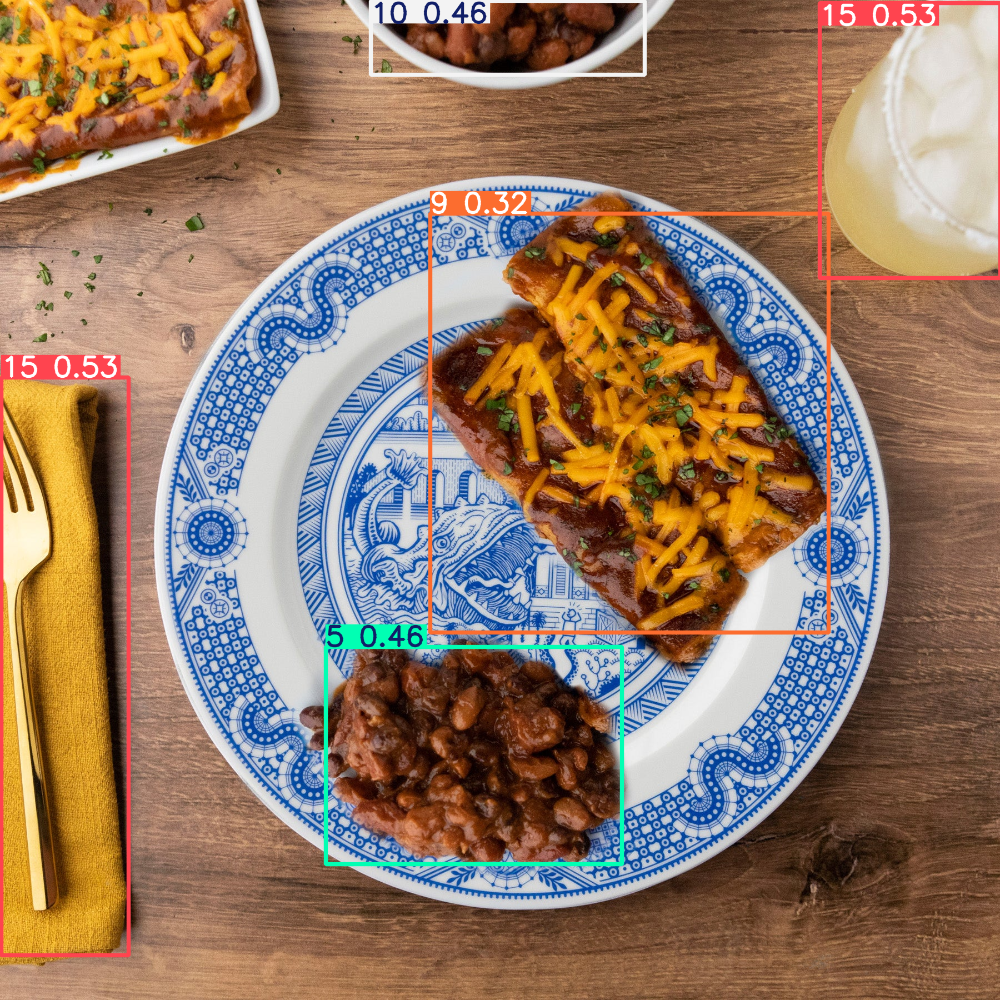

In [6]:
image_url = "https://calamityware.com/cdn/shop/products/CalamitywarePlate6-SeaMonster_2_2048x.jpg?v=1657222063"  # Replace with your image URL
response = requests.get(image_url)
img = Image.open(BytesIO(response.content))

results = model.predict(img)
results[0].show()  # Display bounding boxes

In [ ]:

results = model.predict(source="https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTh5EOnqcglN0HvQ5oNVlXjazQ0t0DZE4fF5A&s", stream=True)  # For videos/long sequences

results[0].show()  

# Print detected foods
for result in results:
    for box in result.boxes:
        print(f"Detected: {model.names[box.cls.item()]}")  
        print(f"Confidence: {box.conf.item():.2f}")  